# 1. Exercise:

## 1.1. Introduction and Imports

- Load Exercise_01_Template.ipynb
- Save this file as Exercise_01_Group_xx.ipynb where xx is your group number.
- Put your Group number and your names in the first paragraph of the file.
- Groups have to have at least 2 members and a maximum of 3 members.

In [2]:
# Group Number: xx
# Group Members: xx xx, yy yy, (zz zz) 

# Imports
import numpy as np
from matplotlib import pyplot as plt
import matplotlib
import numpy.matlib as ml
import imageio
import skimage.transform
import scipy

%matplotlib inline
# Set default figure size as plots and images are displayed very small otherwise (parameters are intended to represent width and height in inches)
matplotlib.rcParams['figure.figsize'] = (8.0, 8.0)
plt.style.use('dark_background')
#print(plt.style.available)
plt.style.use('dark_background')
print('Hello Filmtechnique')

Hello Filmtechnique


## 1.2. Load and display an image
- Load the image Exercise_01_Peppers.png into Python and display it
- The result should look as follows:

<img src="Exercise_01_Result_1_2.png" alt="Result" style="width: 256px;"/>

(384, 512, 3)

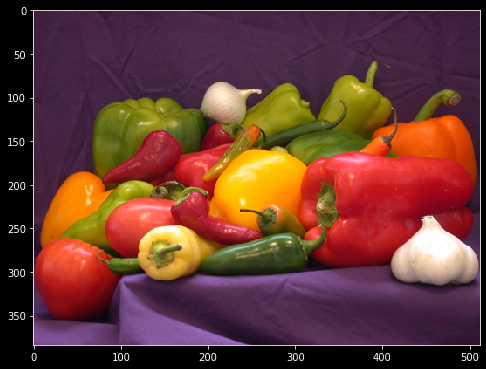

In [3]:
# Read "Exercise_01_Peppers.png"
peppersImg = plt.imread('Exercise_01_Peppers.png')


# Plot peppersImg
plt.imshow(peppersImg)
# Your code here

# Output image size
peppersImg.shape

In [4]:
# Cool, let's try some:
print( "Max: " + str( peppersImg.max()  ) )
print( "Min: " + str( peppersImg.min()  ) )
print( "Mean: " + str( peppersImg.mean() ) )

Max: 1.0
Min: 0.0
Mean: 0.3200149


## 1.3 Let's play with indexing - display a white square and circle on black background
- Create a black image with a white square in the middle by using indexing.
- The result should look as follows:

<img src="Exercise_01_Result_1_3_Square.png" alt="Result" style="width: 256px;"/>

(200, 200)

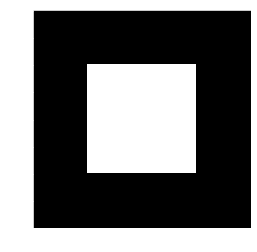

In [3]:
# Initialize Black image of size 200*200 pixel
squareImg = np.zeros( (200, 200) )

# Add White square
for i in range(50,150):
    for j in range(50,150):
        squareImg[i,j] = True

# Plot
plt.imshow(squareImg, cmap='gray', vmin=0.0, vmax=1.0)
squareImg.shape

- Now do the same but display a white circle
- The result should look as follows:

<img src="Exercise_01_Result_1_3_Circle.png" alt="Result" style="width: 256px;"/>

In [4]:
# Initialize Black image of size 200*200 pixel
circleImg = np.zeros( (200, 200) )
imgSize = 200
# Create varable which contain the x and y position in the image
xPos = np.tile( np.reshape( np.arange(0,200), ( imgSize, 1 ) ), [1, imgSize ] )
yPos = np.tile( np.reshape( np.arange(0,200), ( 1, imgSize ) ), [imgSize, 1 ] )

# Add awhite circle by setting all pixel inside the circle to 1.0. (Conditional indexing)
np.set_printoptions(precision = 1)
np.clip(2- np.sqrt( np.power(vPos -4.5, 2.0)+ np.power(hPos -4.5,2-0)),0.0,1.0)
#circleImg = # Your code here

""" for i in range(200):
    for j in range(200):
        if ml.sqrt((xPos[i,j]-100)**2 + (yPos[i,j]-100)**2) <= 50:
            circleImg[xPos[i, j], yPos[i,j]] = 1 """
circleImg = np.sqrt(np.power(xPos-imgSize/2.0,2.0) +np.power(yPos-imgSize/2.0,2.0))
#circleImg.shape
# Plot
plt.imshow(circleImg, cmap='gray', vmin=0.0, vmax=1.0)
circleImg.shape


NameError: name 'vPos' is not defined

In [4]:
# By the way - how do I find methods like 'shape'?
dir( peppersImg )

In [2]:
# Bonus: Do you have a simple idea how to render a smoother border?
#circleImg = # Your code here
""" for i in range(200):
    for j in range(200):
        if ml.sqrt((xPos[i,j]-100)**2 + (yPos[i,j]-100)**2) < 50:
            circleImg[xPos[i, j], yPos[i,j]] = 1
        elif ml.sqrt((xPos[i,j]-100)**2 + (yPos[i,j]-100)**2) <= 50:
            circleImg[xPos[i, j], yPos[i,j]] = 0.5 """
circleImg = np.clip(50 - np.sqrt( np.power(xPos-100.0,2.0) + np.power(yPos-100.0,2.0) ), -1.0,1.0 )
# Plot
plt.imshow(circleImg, cmap='gray', vmin=-1.0, vmax=1.0)
circleImg.shape

NameError: name 'xPos' is not defined

## 1.4. The sRGB Color Space
- Typical images like the file peppers.png are stored in sRGB color space.
- Load peppers.png into the variable img_sRGB.
- Add two horizontal gradients below the image, one from 0.4 to 0.6 and one from 0 to 0.1 both in 0…1 sRGB domain. See image on the right for an example.
- Display this image with different brightness offsets.
- Linearize this file according to the formula given in: https://www.w3.org/Graphics/Color/sRGB.html and save it into a variable called img_Linear.
- Display this linearized image. What needs to be done so that it looks correct again?
- Display this image at different brightness levels implementing brightness in linear domain.
- Is ‘+’ still the correct operation to implement brightness? No! Implement a better operator.

(128, 512, 3)

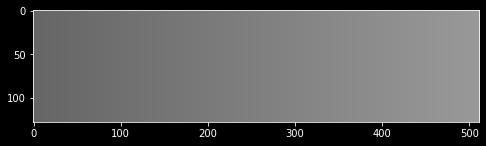

In [10]:
# Create a 128*512 pixel horizontal gradient from 0.4 to 0.6 in 0…1 sRGB domain.

gradient1 = np.zeros((128,512,3))
'''for a in range(128):
    for b in range (512):
        for c in range (3):
            x = 0.4 +(0.2/512)*b
            gradient1[a,b,c] = x'''
#gradient1 = np.reshape(np.tile(np.reshape(np.tile(np.arange(0.4,0.6,(0.2/512)),128),[128,512]),3),[128,512,3],'F')
h = 512 #Debuge Code
v = 128 #Debuge Code
gradient1 = np.tile(np.reshape(np.linspace(0.4,0.6,h),(1,h,1)),[v,1,3])
#np.linespace(0.4,0.6,512).shape # Code für arryausgabe
'''peppersImg[50:150 , : , 0] = 255 # full intensity to those pixel's R channel
plt.figure( figsize = (10,10))
plt.imshow(peppersImg)
plt.show()'''


# Plot gradient
plt.imshow( gradient1 )
gradient1.shape

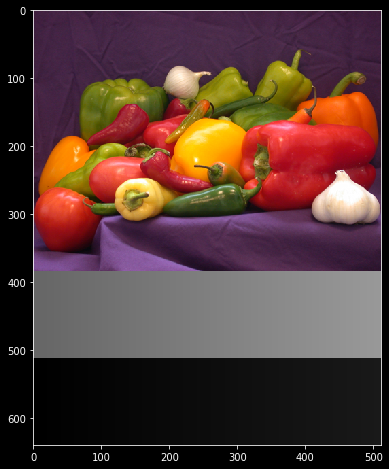

In [11]:
# Create a 128*512 pixel horizontal gradient from 0.0 to 0.1 in 0…1 sRGB domain.
gradient2 = np.zeros((128,512,3))
gradient2 = np.reshape(np.tile(np.reshape(np.tile(np.arange(0.0,0.1,(0.1/512)),128),[128,512]),3),[128,512,3],'F')

# Load peppers.png into the variable peppersImg 
peppersImg = plt.imread('Exercise_01_Peppers.png')

# Concatenate all three images
img_sRGB = np.concatenate( ( peppersImg, gradient1, gradient2 ), axis=0 )

# Plot the combined Image
plt.imshow( img_sRGB )

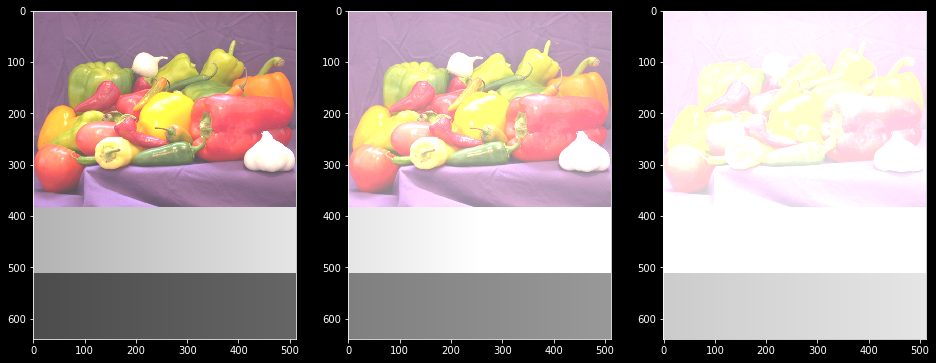

In [12]:
# Display with different brightness offsets

brightness1 = 0.3
brightness2 = 0.5
brightness3 = 0.8

plt.figure(figsize=(16,8))  # Alternative to figsize setting in the first code block
plt.subplot(1,3,1)
plt.imshow( np.clip( img_sRGB + brightness1, 0.0, 1.0) );
plt.subplot(1,3,2)
plt.imshow( np.clip( img_sRGB + brightness2, 0.0, 1.0) );
plt.subplot(1,3,3)
plt.imshow( np.clip( img_sRGB + brightness3, 0.0, 1.0) );

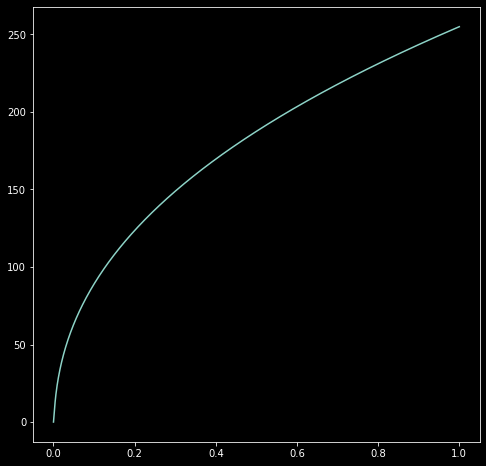

In [29]:
# Now implement the sRGB functions so that we can use them to convert our image to linear domain
""" def linear2sRGB(x):
    if x.any() > 0.0031308:
        sRGB = 1.055 * (pow(x, (1.0 / 2.4))) - 0.055
    else:
        sRGB = 12.92 * x
    return sRGB """

def linear2sRGB(srgb):
	linear = np.float32(srgb) / 255.0
	less = linear <= 0.04045
	linear[less] = linear[less] / 12.92
	linear[~less] = np.power((linear[~less] + 0.055) / 1.055, 2.4)
	return linear


'''def sRGB2linear(x):
    if x <= 0.0404482362771082:
        linear = x / 12.92  
    else:
        linear = pow(((x + 0.055) / 1.055), 2.4)
    return linear'''

def sRGB2linear(linear):
	srgb = linear.copy()
	less = linear <= 0.0031308
	srgb[less] = linear[less] * 12.92
	srgb[~less] = 1.055 * np.power(linear[~less], 1.0 / 2.4) - 0.055
	return srgb * 255.0

#Plot zum Test    
a = np.linspace(0,1,1000)
plt.plot(a, sRGB2linear(a))

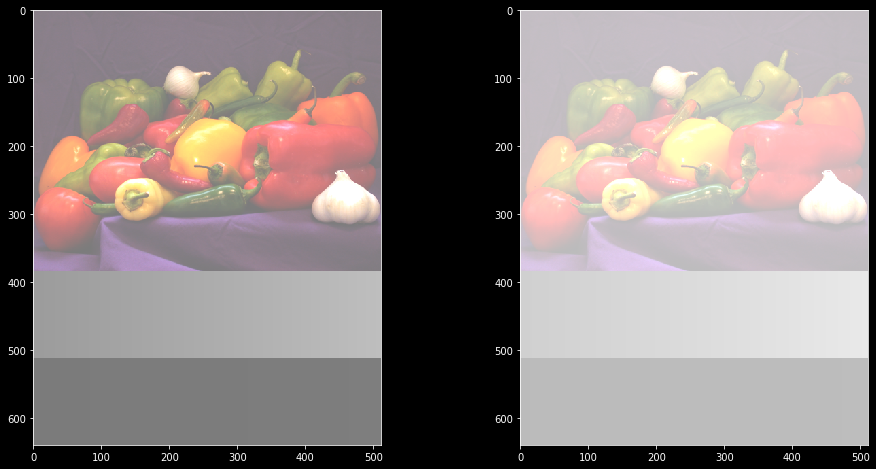

In [22]:
# No let's try to apply '+' as a brightness opaerator in linear domain:
brightness1 = 0.2
brightness2 = 0.5
img_Linear = sRGB2linear( img_sRGB )
plt.figure( figsize = (16,8) )  # Alternative to figsize setting in the first code block
plt.subplot(1,2,1)
plt.imshow( np.clip( linear2sRGB( img_Linear + brightness1 ), 0.0, 1.0 ) );
plt.subplot(1,2,2)
plt.imshow( np.clip( linear2sRGB( img_Linear + brightness2 ), 0.0, 1.0 ) );

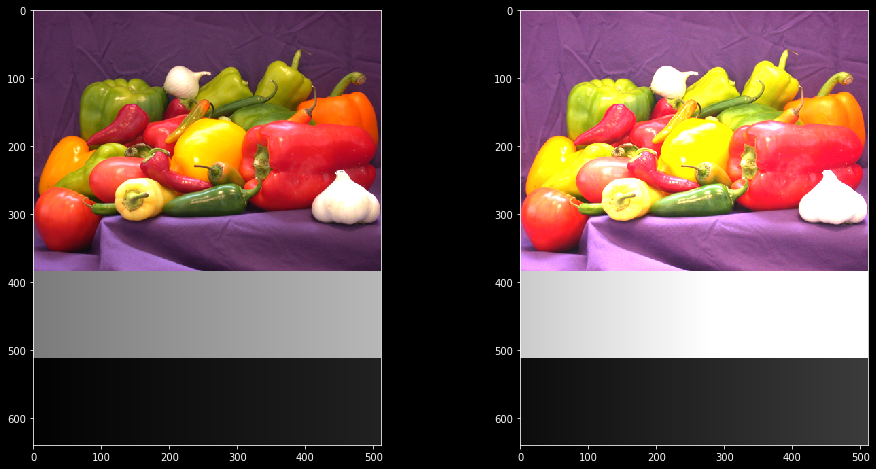

In [15]:
# Using the '+' operator does not work well. Exchange for a better operator and display

brightness1 = 1.5
brightness2 = 4.5
img_Linear = sRGB2linear( img_sRGB )
plt.figure( figsize = (16,8) )  # Alternative to figsize setting in the first code block
plt.subplot(1,2,1)
plt.imshow( np.clip( linear2sRGB( img_Linear * brightness1 ), 0.0, 1.0 ) );
plt.subplot(1,2,2)
plt.imshow( np.clip( linear2sRGB( img_Linear * brightness2 ), 0.0, 1.0 ) );
# Please explain your choice of operator in words and why it is a good match to '+' in perceptual domain.
# Your Explanation here
# Your Explanation here
# Your Explanation here

## 1.5. Filtering in linear domain
Some operations must be performed in linear domain to get a realistic result.
- Load Exercise_01_Playground_c_Timo_Kunkel.exr.
- Display the image on your monitor.
- Use imfilter with the supplied filter kernel in pq and in linear domain. What do you observe?

In [48]:
# This functions provides read support for OpenEXR files. You only have to execute it once per computer.
imageio.plugins.freeimage.download()

Imageio: 'libfreeimage-3.16.0-osx10.6.dylib' was not found on your computer; downloading it now.
Try 1. Download from https://github.com/imageio/imageio-binaries/raw/master/freeimage/libfreeimage-3.16.0-osx10.6.dylib (4.3 MB)
Downloading:8192/4461680 bytes (0.2%573440/4461680 bytes (12.91843200/4461680 bytes (41.3%3137536/4461680 bytes (70.3%4423680/4461680 bytes (99.1%4461680/4461680 bytes (100.0%)
  Done
File saved as /Users/kurteifler/Library/Application Support/imageio/freeimage/libfreeimage-3.16.0-osx10.6.dylib.


In [5]:
# Read typical HDR image from disk
linImg = imageio.imread("Exercise_01_Playground_c_Timo_Kunkel.exr")

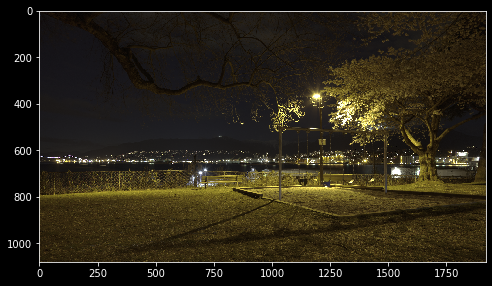

In [19]:
# Convert to sRGB and display
sRGBImg = np.clip( linear2sRGB( linImg ), 0.0, 1.0 );
plt.imshow( sRGBImg );

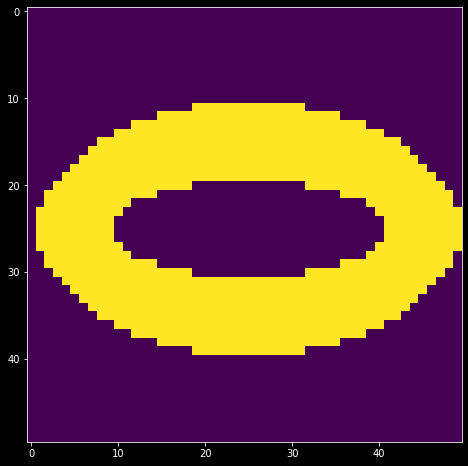

In [15]:
# Apply a "nice" aperture to the image for a 'bokeh-style' effect

# Import polygon function
from skimage.draw import polygon

# Init aperture
aperture = np.zeros((40, 40))
xPos = np.array([-1, -0.5, 0.5, 1, 0.5, -0.5, -1])*20+20
yPos= np.sqrt(3) * np.array([0, -0.5, -0.5, 0, 0.5, 0.5, 0])*20+20
xIdx, yIdx = polygon(xPos, yPos)

#Init aperture 2
from skimage import draw, morphology

aperture2 = np.zeros((50, 50))
rr, cc = draw.ellipse_perimeter(25, 25, 10, 20)
aperture2[rr, cc] = 1
dilated = morphology.dilation(aperture2, morphology.disk(radius=4))
'''fig, (ax0, ax1) = plt.subplots(1, 2)
ax0.imshow(aperture2)
ax1.imshow(dilated)'''
dilated = dilated /512
# Set pixels inside polygon to 1
aperture[xIdx, yIdx] = 1

#aperture.image_rgba(image=[sRGBImg], x=0, y=0, dw=10, dh=1)
# TODO Hier gehts weiter:
# Normalize aperture
aperture = aperture /np.sum(aperture)
plt.imshow( dilated)


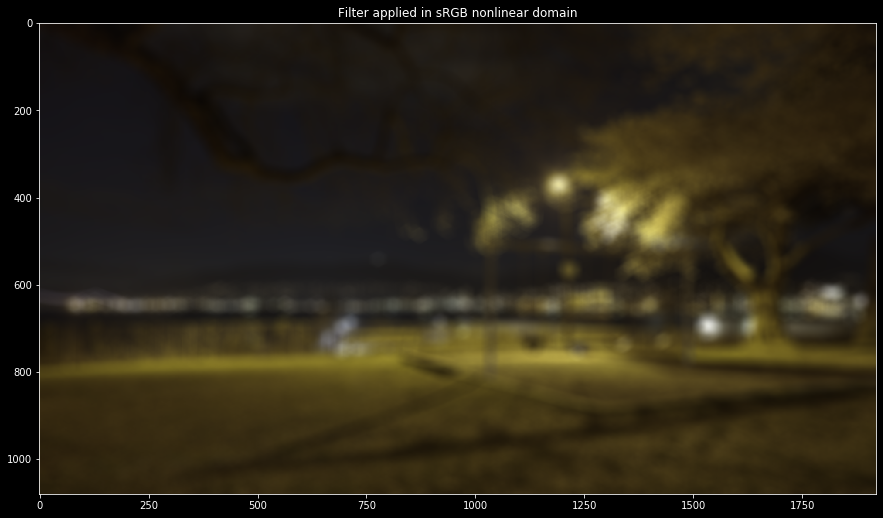

In [20]:
# Apply filter in sRGB domain and display
convolve_sRGBImg = np.zeros((linImg.shape))
for i in range(3):
    convolve_sRGBImg[:,:,i] = scipy.ndimage.convolve( sRGBImg[:,:,i], aperture )

plt.figure(figsize=(15,10))
plt.title('Filter applied in sRGB nonlinear domain')
#np.savetxt("sRGBImg.txt", convolve_sRGBImg.reshape())
plt.imshow( convolve_sRGBImg );

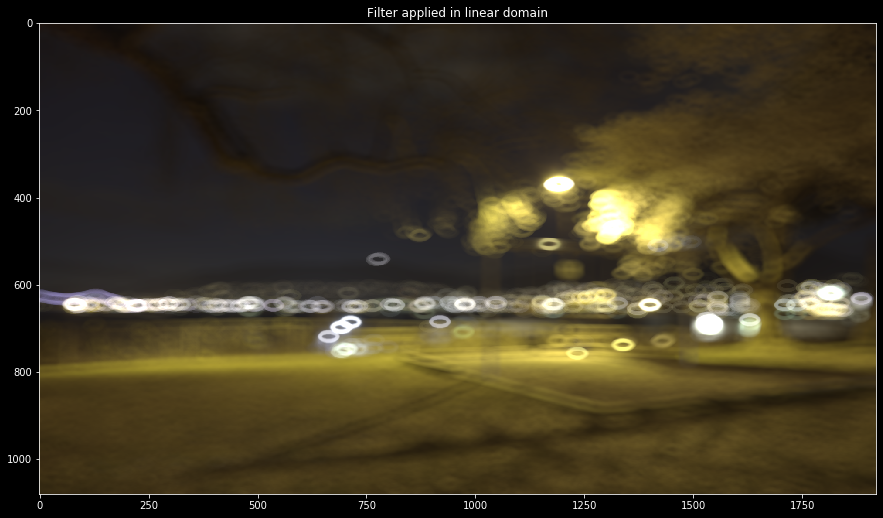

In [21]:
# Apply filter in linear domain and display
convolve_linImg = np.zeros((linImg.shape))
for i in range(3):
    convolve_linImg[:,:,i] = scipy.ndimage.convolve( linImg[:,:,i], dilated)
plt.figure(figsize=(15,10))
plt.title('Filter applied in linear domain')
plt.imshow( np.clip( linear2sRGB( convolve_linImg ), 0.0, 1.0 ) );

# Explain why the 'Bokeh' Effect can only be simulated in linear domain
# Your explanation here
# Your explanation here
# Your explanation here

# Bonus: Play with different apertures, e.g. stars, rings, hearts,...

## 1.6 Image quantization
Is it meaningful to talk about image quantization without referencing if the image is coded in linear or
perceptual domain?
- Quantize the image from 1.4. (including the ramps) in both domains, linear and sRGB to bit depths between 4 and 16 bits.
- How many bits are needed in each domain for a visually transparent display?
- Just for your information: Most DSLRs quantize with 12bits or 14bit in linear sensor domain. Is this better compared to 8bits of tonal resolution in sRGB domain?

In [19]:
#Picture Import
peppersImg = plt.imread('Exercise_01_Peppers.png')

# Write formula for quantization

def quantize( img,bitDepth ):
    return np.round(img * ( np.power( 2, bitDepth-1 ) ) ) / ( np.power( 2, bitDepth-1 ) ) #R return # Your code here

#roundet = x*2pow(y-1)/2pow(y-1)

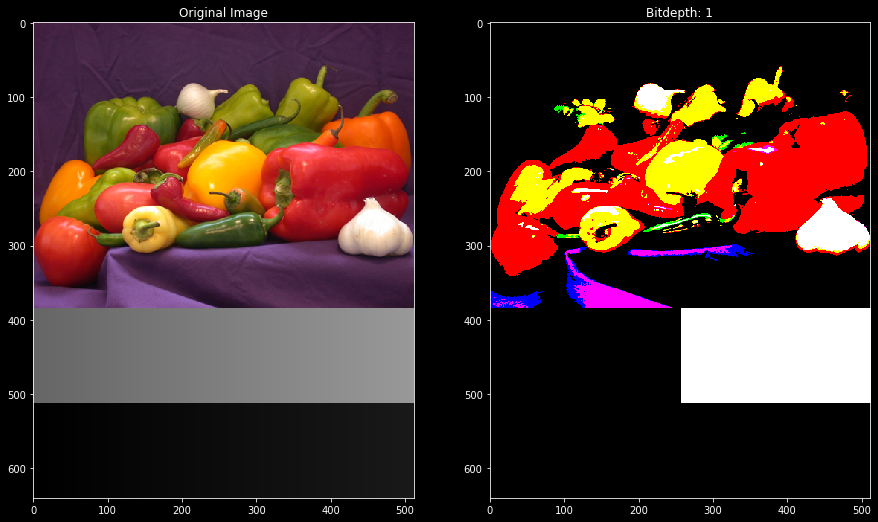

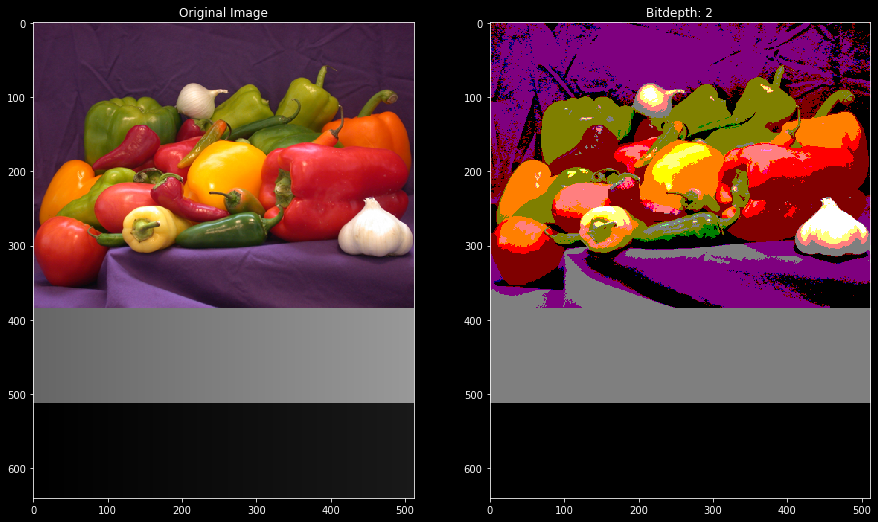

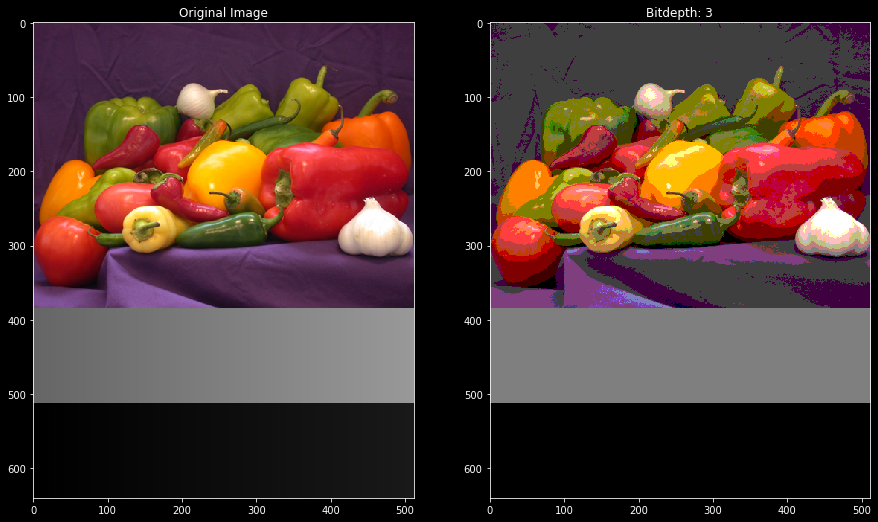

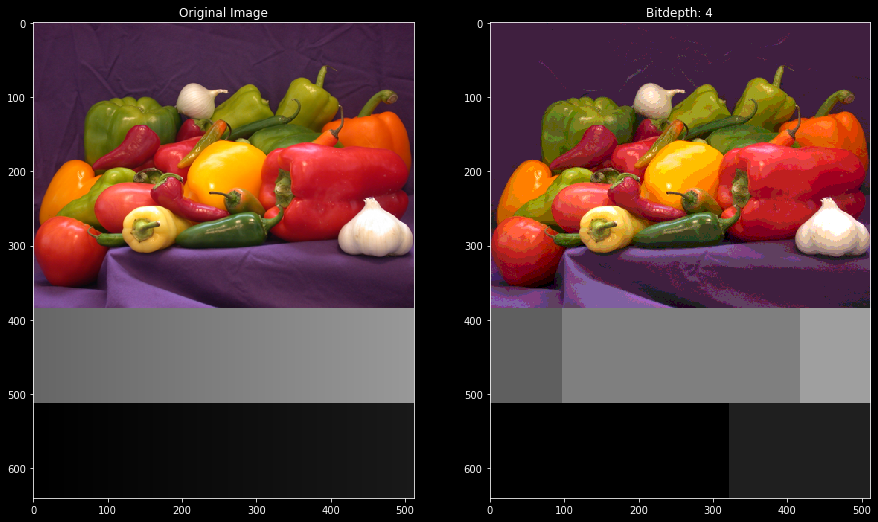

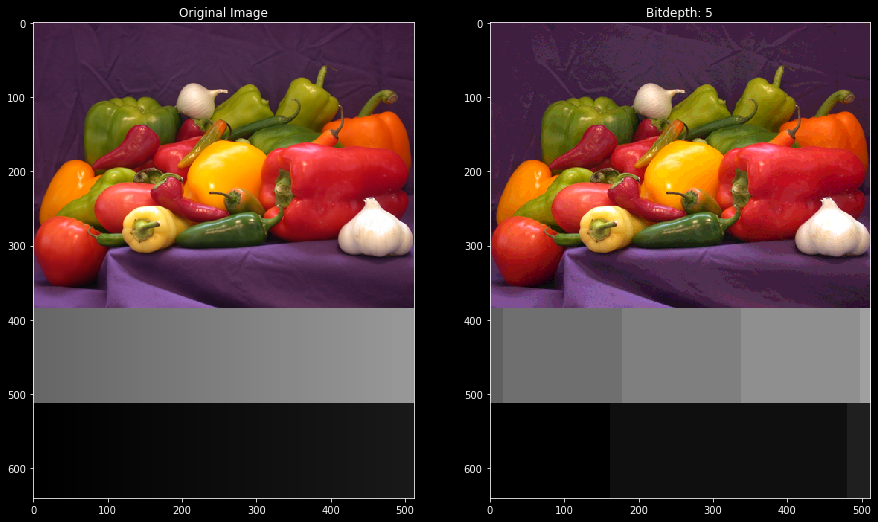

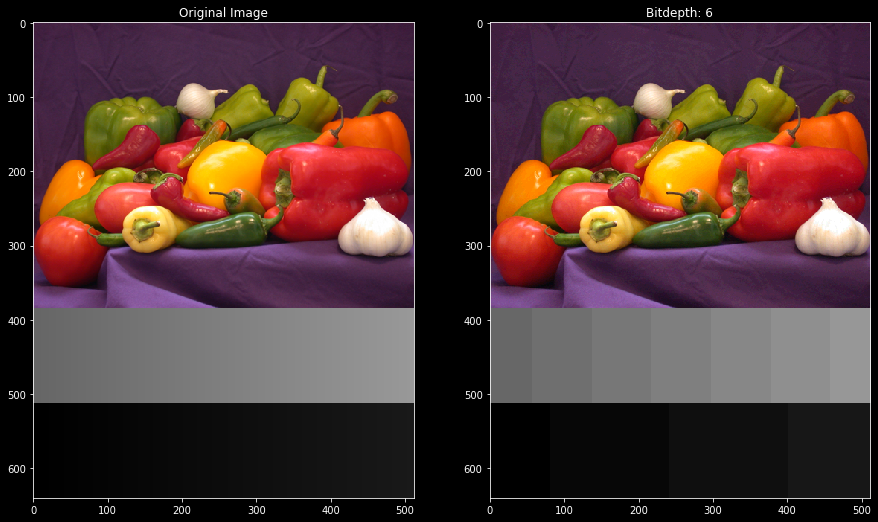

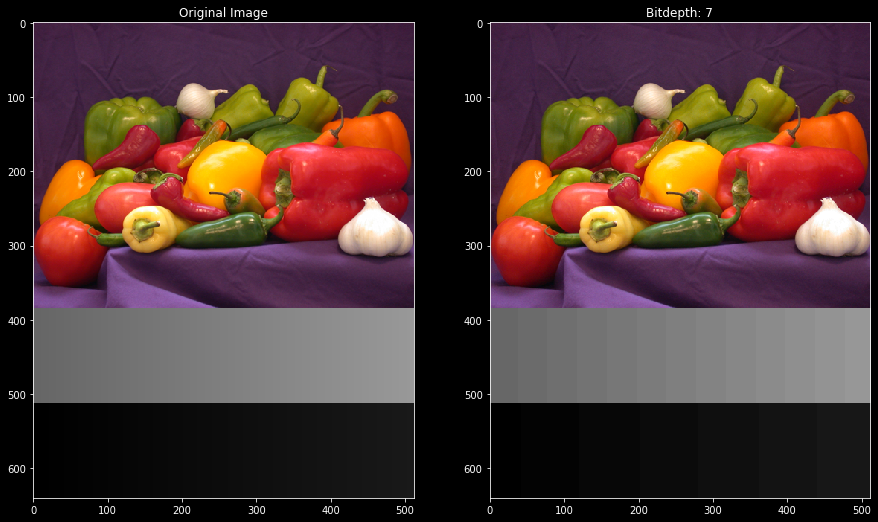

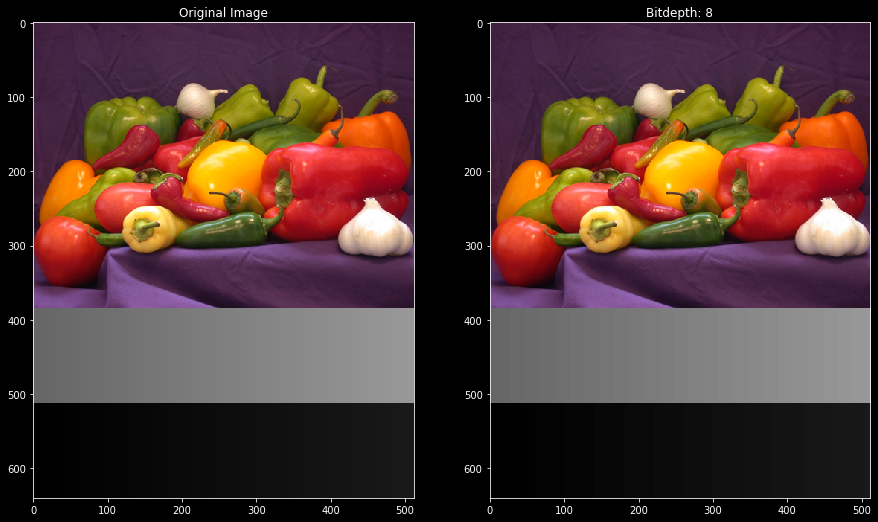

In [20]:
# What bit-depth is needed for visually tranparent quantization in sRGB domain?
# Plot our 'img_sRGB' quantized in sRGB domain quantized to 1...8 bits
for bitDepth in range(1,9):
    plt.figure(figsize=(15,10))
    plt.subplot(1,2,1)
    plt.title('Original Image')
    plt.imshow(img_sRGB)
    plt.subplot(1,2,2)
    plt.title('Bitdepth: ' + str( bitDepth) )
    plt.imshow( quantize( img_sRGB, bitDepth) )
    plt.show()

# What is the nimimun bit-depth that can be used for quantizing the image without artifacts? 
# Is this the same value for the gradients compared to the image?


In [ ]:
# What bit-depth is needed for visually tranparent quantization in linear domain?
# Plot our 'img_sRGB' quantized in linear domain quantized to 1...16 bits
for bitDepth in range(1,17):
    # Your code here
    # Your code here
    # Your code here
    # Your code here
    # Your code here
    # Your code here
    # Your code here
# What is the nimimun bit-depth that can be used for quantizing the image without artifacts? 
# Is this the same value for both gradients?s

## 1.7 Dependency of quantization artifact visibility on noise 
The minimum contrast visibility is highly dependent on noise. Find the needed tonal resolution
depending on Gaussian noise before and after quantization.
- Create two 1024 pixel wide horizontal ramps, one from 0 to 0.1 and one from 0.5 to 0.6 in sRGB 0…1 domain.
- Display this gradient quantized to 8bit.
- Find the needed tonal resolution (quantization bit depth) to display this gradient without banding artifacts on your monitor.
- Display the image and the gradient adding Gaussian noise with a standard deviation of one 8bit code value (1/255) before quantization. Which bit depth is now needed?
- Display the image and the gradient adding Gaussian noise with a standard deviation of one 8bit code value (1/255) after quantization. Which bit depth is now needed?
- Explain why adding noise before quantization has a different effect compared to adding noise after quantization.
- Simulate the photon shot noise of a typical video camera with a full well capacity of 3000 photons per sensor element and assess the needed tonal resolution (quantization bit depth) for images acquired with such a camera if the sensor would not introduce any additional noise to the photon shot noise you simulated.
- Why does the gradient need a different bit-depth compared to the image?
- How does this change your assessment of the needed bit-depth for linear RAW-camerafootage from exercise 1.6?

In [ ]:
# Create horizontal ramp from 0 to 0.1 and 0.5 to 0.6

ramp1 = # Your code here
# Your code here
# Your code here

ramp2 = # Your code here
# Your code here
# Your code here

ramp = np.concatenate( ( ramp1, ramp2 ), axis=0 )             

In [ ]:
# Display quantized. Find the needed quantization for display without banding artifacts
myBitDepth = 5 # Adjust here

# Display
plt.figure( figsize = ( 15, 10 ) )
plt.title( 'Quantisierung mit '+ str( myBitDepth ) + ' Bit' )
plt.imshow( quantize( ramp, myBitDepth  ) );

In [ ]:
# Add gaussian noise with a standard deviation of one 8bit code value (1/255)
# Find the needed quantization for the ramp if this noise is added before quantization

# Add noise to the ramp
myBitDepth = 5 # Adjust here
myNoiseStDevIn8BitCVs = 1

# Add noise to ramp
randramp = ramp + # Your code here

# qunatize Ramp with added noise
randRampQuantized = quantize( randRamp, myBitDepth)

# Display
plt.figure(figsize=(15,10))
plt.title( 'Noise with a StDev of ' + str(myNoiseStDevIn8BitCVs) + ' 8bit CVs, then quantization to '+ str( myBitDepth ) + ' Bit' )
plt.imshow( np.clip( randRampQuantized, 0.0, 1.0 ) );


In [ ]:
# Find the needed quantization for the ramp if this noise is added after quantization
myBitDepth = 5 # Adjust here
myNoiseStDevIn8BitCVs = 1

# Quantize Ramp
quantRamp = quantize( ramp, myBitDepth )

# Add noise to already quantized ramp 
quantAndNoiseRamp = # Your code here

# Display
plt.figure(figsize=(15,10))
plt.title( 'Quantization to ' + str( myBitDepth ) + ' Bit, then add Noise with a StDev of ' + str(myNoiseStDevIn8BitCVs) + ' 8bit CVs' )
plt.imshow( np.clip( quantAndNoiseRamp, 0.0, 1.0 ) );

In [ ]:
#Now simulate a typical video camera with a full well capacity of 10000 photons per sensor element.

# Convert img from sRGB to linear
img_Linear = sRGB2linear( img_sRGB )

In [ ]:
# Add poisson distibuted photon shot noise assuming white equals 3000 photons
# Reference: HPA 2015, 4k-HDR-Imagers, Dr Peter Centen

# Add poisson Noise (skimage.util.random_noise) may be useful
img_LinearPNoise = # Your code here

plt.figure(figsize=(15,10))
plt.imshow( np.clip( linear2sRGB( img_LinearPNoise ), 0.0, 1.0) );

In [ ]:
# Find out which minimum quantization is needed for lossless display of broadcast imagery
myBitDepth = 5 # Adjust here

# Qunatize Image with added photon shot noise
img_LinearPNoiseQuantized = quantize( img_LinearPNoise, myBitDepth)

# Display
plt.figure( figsize = (15,10) )
plt.title( 'Simulated image from UHD broadcast camera quantized to '+ str( myBitDepth ) + ' Bit' )
plt.imshow(   # Your code here

# Explain how these findings change your assessment of the needed bit-depth for
# linear RAW camera footage from exercise 1.6?